In [1]:
import pandas as pd
from fbprophet import Prophet

In [2]:
%matplotlib inline
from fbprophet import Prophet
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
from datetime import datetime, timedelta
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
from pytz import timezone as tz

In [3]:
from time import time
from datetime import date
from datetime import datetime

In [4]:
df_energy = pd.read_csv('../data/energy/'+ "eco2mix-regional-cons-def.csv", sep=";",
                parse_dates=["Date - Heure"]).sort_values(by=["Région", "Date - Heure"])

In [5]:
df_energy = df_energy[["Région", "Date - Heure", "Consommation (MW)"]]

In [6]:
df_energy.fillna(df_energy.dropna()["Consommation (MW)"].mean(), inplace=True)

In [7]:
df_energy.isnull().sum()

Région               0
Date - Heure         0
Consommation (MW)    0
dtype: int64

In [12]:
df_energy.dtypes

Région                object
Date - Heure          object
Consommation (MW)    float64
date                  object
dtype: object

In [15]:
df_energy.fillna(df_energy.dropna()["Consommation (MW)"].mean(), inplace=True)
df_energy["date"] = df_energy["Date - Heure"].apply(lambda x: x + timedelta(minutes=x.minute))
df_energy["date"] = df_energy["date"].apply(lambda x: x.astimezone(tz("UTC")))
df_energy["date"] = df_energy["date"].apply(lambda x: x.fromtimestamp(x.timestamp()))
df_energy.head(3)

,Région,Date - Heure,Consommation (MW),date
147167,Auvergne-Rhône-Alpes,2013-01-01 00:00:00+01:00,4528.493194,2013-01-01 00:00:00
147170,Auvergne-Rhône-Alpes,2013-01-01 00:30:00+01:00,8173.000000,2013-01-01 01:00:00
1017843,Auvergne-Rhône-Alpes,2013-01-01 01:00:00+01:00,7944.000000,2013-01-01 01:00:00


In [16]:
df_energy.head()

,Région,Date - Heure,Consommation (MW),date
147167,Auvergne-Rhône-Alpes,2013-01-01 00:00:00+01:00,4528.493194,2013-01-01 00:00:00
147170,Auvergne-Rhône-Alpes,2013-01-01 00:30:00+01:00,8173.000000,2013-01-01 01:00:00
1017843,Auvergne-Rhône-Alpes,2013-01-01 01:00:00+01:00,7944.000000,2013-01-01 01:00:00
147173,Auvergne-Rhône-Alpes,2013-01-01 01:30:00+01:00,7896.000000,2013-01-01 02:00:00
1017845,Auvergne-Rhône-Alpes,2013-01-01 02:00:00+01:00,7882.000000,2013-01-01 02:00:00


In [19]:
# group by day:
df_region_per_hour = df_energy.groupby(["Région", "date"], as_index=False).agg({"Consommation (MW)": np.sum})

In [20]:
df_region_per_hour.head()

,Région,date,Consommation (MW)
0,Auvergne-Rhône-Alpes,2013-01-01 00:00:00,4528.493194
1,Auvergne-Rhône-Alpes,2013-01-01 01:00:00,16117.000000
2,Auvergne-Rhône-Alpes,2013-01-01 02:00:00,15778.000000
3,Auvergne-Rhône-Alpes,2013-01-01 03:00:00,15618.000000
4,Auvergne-Rhône-Alpes,2013-01-01 04:00:00,14944.000000


# Filter on Ile de France

In [95]:
df_region_per_hour_ile_de_france = df_region_per_hour[df_region_per_hour['Région']=='Ile-de-France']

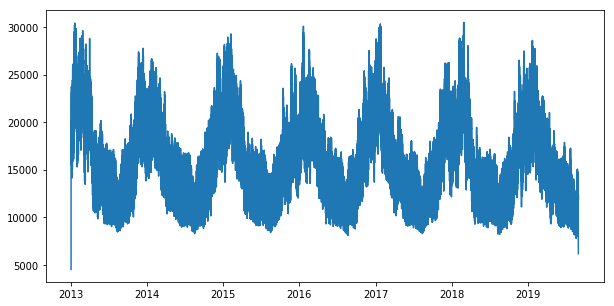

In [96]:
plt.figure(figsize=(10,5))
plt.plot(df_region_per_hour_ile_de_france["date"], df_region_per_hour_ile_de_france["Consommation (MW)"])

# Prophet for forcasting Ile de France energy

### 1) Ile de France only 2 years ( 2017/2018/2019)

In [97]:
df_region_per_hour_ile_de_france.dtypes

Région                       object
date                 datetime64[ns]
Consommation (MW)           float64
dtype: object

In [98]:
df_region_per_hour_ile_de_france.head()

,Région,date,Consommation (MW)
350460,Ile-de-France,2013-01-01 00:00:00,4528.493194
350461,Ile-de-France,2013-01-01 01:00:00,17956.000000
350462,Ile-de-France,2013-01-01 02:00:00,16728.000000
350463,Ile-de-France,2013-01-01 03:00:00,15998.000000
350464,Ile-de-France,2013-01-01 04:00:00,15107.000000


In [99]:
df_region_per_hour_ile_de_france['date_time']=pd.to_datetime(df_region_per_hour_ile_de_france['date'], format='%Y-%m-%d')

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [100]:
df_region_per_hour_ile_de_france.head()

,Région,date,Consommation (MW),date_time
350460,Ile-de-France,2013-01-01 00:00:00,4528.493194,2013-01-01 00:00:00
350461,Ile-de-France,2013-01-01 01:00:00,17956.000000,2013-01-01 01:00:00
350462,Ile-de-France,2013-01-01 02:00:00,16728.000000,2013-01-01 02:00:00
350463,Ile-de-France,2013-01-01 03:00:00,15998.000000,2013-01-01 03:00:00
350464,Ile-de-France,2013-01-01 04:00:00,15107.000000,2013-01-01 04:00:00


In [101]:
df_region_per_hour_ile_de_france.dtypes

Région                       object
date                 datetime64[ns]
Consommation (MW)           float64
date_time            datetime64[ns]
dtype: object

In [102]:
# Select training set:
df_region_per_hour_ile_de_france_2013_2018 = df_region_per_hour_ile_de_france[(df_region_per_hour_ile_de_france['date_time']<='2018-12-31')]



In [30]:
df_region_per_day_ile_de_france_2017_2018.tail()

,Région,date,Consommation (MW),date_time
403010,Ile-de-France,2018-12-30 20:00:00,20147.0,2018-12-30 20:00:00
403011,Ile-de-France,2018-12-30 21:00:00,19483.0,2018-12-30 21:00:00
403012,Ile-de-France,2018-12-30 22:00:00,18499.0,2018-12-30 22:00:00
403013,Ile-de-France,2018-12-30 23:00:00,18997.0,2018-12-30 23:00:00
403014,Ile-de-France,2018-12-31 00:00:00,18752.0,2018-12-31 00:00:00


In [31]:
df_region_per_hour_ile_de_france_2013_2018.tail()

,Région,date,Consommation (MW),date_time
403010,Ile-de-France,2018-12-30 20:00:00,20147.0,2018-12-30 20:00:00
403011,Ile-de-France,2018-12-30 21:00:00,19483.0,2018-12-30 21:00:00
403012,Ile-de-France,2018-12-30 22:00:00,18499.0,2018-12-30 22:00:00
403013,Ile-de-France,2018-12-30 23:00:00,18997.0,2018-12-30 23:00:00
403014,Ile-de-France,2018-12-31 00:00:00,18752.0,2018-12-31 00:00:00


In [32]:
model_energy = Prophet(n_changepoints=100)

In [33]:
df_region_per_hour_ile_de_france_2013_2018.rename(columns={"date_time": "ds"}, inplace=True)
df_region_per_hour_ile_de_france_2013_2018.rename(columns={"Consommation (MW)": "y"}, inplace=True)

/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4223: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [34]:
df_prophet_2013_2018 = df_region_per_hour_ile_de_france_2017_2018[['ds','y']]

In [35]:
df_prophet_2017_2018.tail()

,ds,y
403010,2018-12-30 20:00:00,20147.0
403011,2018-12-30 21:00:00,19483.0
403012,2018-12-30 22:00:00,18499.0
403013,2018-12-30 23:00:00,18997.0
403014,2018-12-31 00:00:00,18752.0


In [36]:
df_prophet_2017_2018.count()

ds    52555
y     52555
dtype: int64

In [ ]:
# It takes me 45 min to train a model  over 5 years !

In [37]:
start_time = time()
model_energy.fit(df_prophet_2013_2018)
end_time = time()
print ("This took %.2f seconds" % (end_time - start_time)/60)

/anaconda3/lib/python3.7/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



This took 2750.76 seconds


In [52]:
df_prophet_2013_2018.tail()

,ds,y
403010,2018-12-30 20:00:00,20147.0
403011,2018-12-30 21:00:00,19483.0
403012,2018-12-30 22:00:00,18499.0
403013,2018-12-30 23:00:00,18997.0
403014,2018-12-31 00:00:00,18752.0


In [55]:
future_ile_de_france_energy_2019 = model_energy.make_future_dataframe(periods=14*24,freq='H', include_history = False)


In [56]:
future_ile_de_france_energy_2019.tail(100)

,ds
236,2019-01-09 21:00:00
237,2019-01-09 22:00:00
238,2019-01-09 23:00:00
239,2019-01-10 00:00:00
240,2019-01-10 01:00:00
241,2019-01-10 02:00:00
242,2019-01-10 03:00:00
243,2019-01-10 04:00:00
244,2019-01-10 05:00:00
245,2019-01-10 06:00:00


In [60]:
start_time = time()
future_energy_forcast_ile_de_france_2019 = model_energy.predict(future_ile_de_france_energy_2019)
end_time = time()
print ("This took %.2f seconds" % (end_time - start_time))

This took 2.25 seconds


In [61]:
future_energy_forcast_ile_de_france_2019[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head(10)

,ds,yhat,yhat_lower,yhat_upper
0,2018-12-31 01:00:00,17077.348923,15167.727386,18926.478516
1,2018-12-31 02:00:00,16054.033029,14101.051678,17965.641572
2,2018-12-31 03:00:00,15011.389820,12867.776277,16973.421093
3,2018-12-31 04:00:00,14423.351570,12368.686367,16440.915235
4,2018-12-31 05:00:00,14658.888123,12918.911418,16502.397232
5,2018-12-31 06:00:00,15707.210894,13861.792071,17613.487999
6,2018-12-31 07:00:00,17185.219805,15227.833951,19148.731528
7,2018-12-31 08:00:00,18612.445107,16926.752007,20594.778065
8,2018-12-31 09:00:00,19705.947304,17730.526630,21551.120710
9,2018-12-31 10:00:00,20454.195359,18381.863858,22104.549038


In [62]:
future_energy_forcast_ile_de_france_2019_cut = future_energy_forcast_ile_de_france_2019[future_energy_forcast_ile_de_france_2019['ds']<='2019-01-01']

In [103]:
# Python
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(model_energy, future_energy_forcast_ile_de_france_2019)  # This returns a plotly Figure
py.iplot(fig)

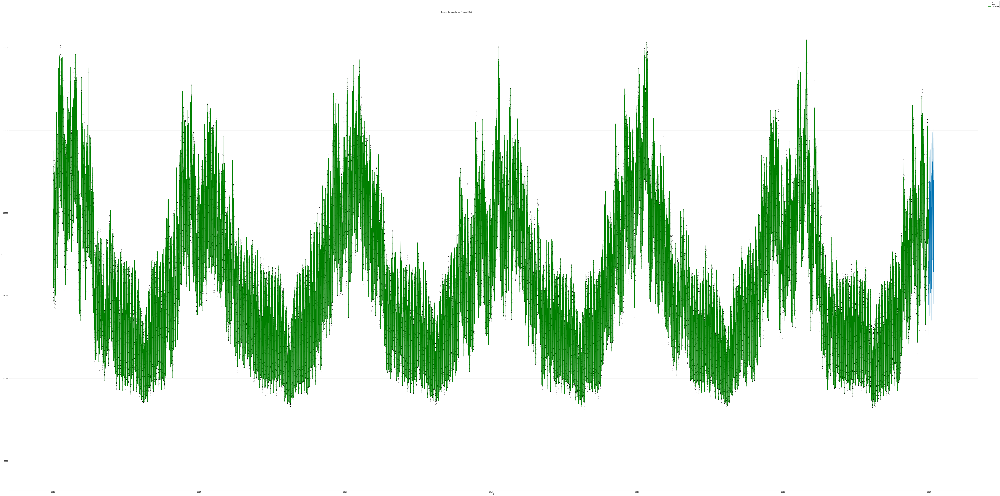

In [94]:

fig1 = model_energy.plot(future_energy_forcast_ile_de_france_2019, uncertainty=True)
plt.plot(df_region_per_day_ile_de_france_2017_2018.ds,df_region_per_day_ile_de_france_2017_2018.y,color='green',label='real data')
fig1.set_size_inches(100,50,forward=True)
fig1.suptitle('Energy forcast Ile de France 2019')
fig1.legend()


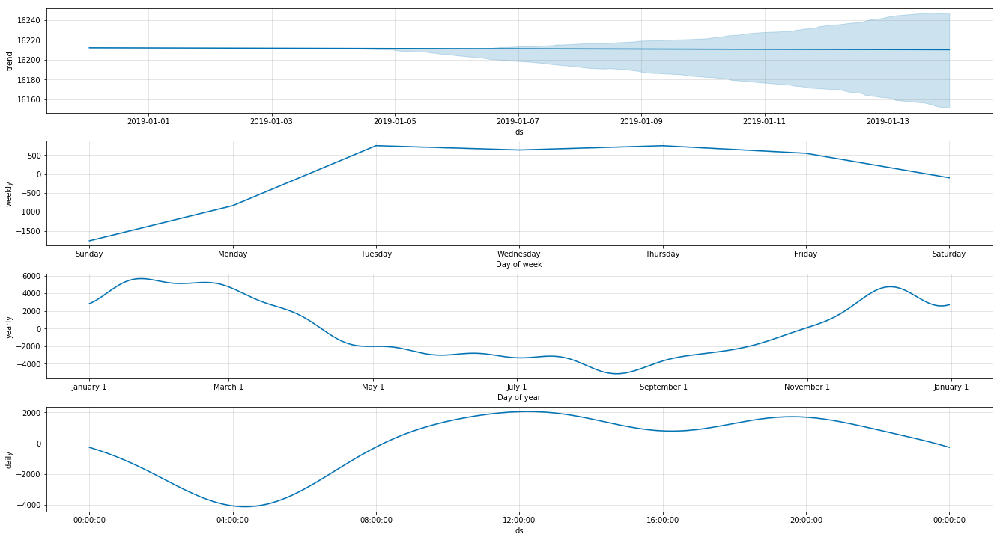

In [68]:
fig2 = model_energy.plot_components(future_energy_forcast_ile_de_france_2019)
fig2.set_size_inches(20,10,forward=True)

## Diagnostic:

In [213]:
# Cross Validation 

In [205]:
from < import cross_validation

In [206]:
cv = cross_validation(model_energy,initial='750 days', period='180 days', horizon = '356 days')

INFO:fbprophet:Making 7 forecasts with cutoffs between 2015-01-25 00:00:00 and 2018-01-09 00:00:00


In [240]:
cv.tail()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
2487,2018-12-27,448360.311475,408246.389354,488896.454343,539964.0,2018-01-09
2488,2018-12-28,442343.954766,402461.274990,481081.406708,541076.0,2018-01-09
2489,2018-12-29,407314.308021,365531.903816,446605.738942,485436.0,2018-01-09
2490,2018-12-30,393774.070796,356123.308088,436806.969470,431795.0,2018-01-09
2491,2018-12-31,445338.814459,406700.520192,485706.921806,442356.0,2018-01-09


In [207]:
from fbprophet.diagnostics import performance_metrics

In [208]:
df_pm = performance_metrics(cv)

In [209]:
df_pm.head()

,horizon,mse,rmse,mae,mape,coverage
0,36 days,1.718387e+09,41453.426341,29337.025869,0.063382,0.666093
1,37 days,1.707457e+09,41321.386874,29252.382761,0.063276,0.670109
2,38 days,1.729237e+09,41584.090646,29466.070923,0.063991,0.672404
3,39 days,1.757785e+09,41925.951385,29696.048981,0.064667,0.668388
4,40 days,1.775849e+09,42140.825148,29823.310427,0.065168,0.666093


In [210]:
from fbprophet.plot import plot_cross_validation_metric

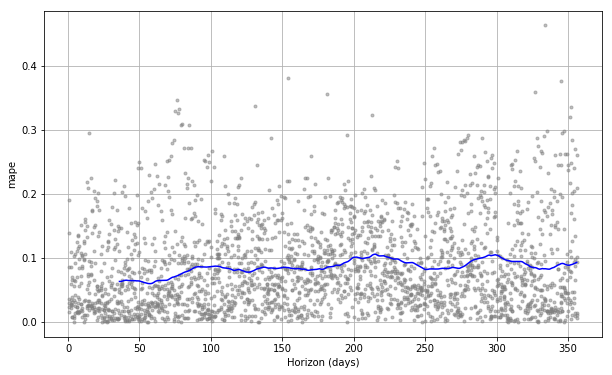

In [216]:
fig = plot_cross_validation_metric(cv,metric='mape')

In [212]:
# test set:

In [69]:
import numpy as np

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [70]:
df_region_per_day_ile_de_france.dtypes

Région                       object
date                 datetime64[ns]
Consommation (MW)           float64
date_time            datetime64[ns]
dtype: object

In [71]:
df_region_per_day_ile_de_france.tail()

,Région,date,Consommation (MW),date_time
408865,Ile-de-France,2019-08-31 20:00:00,12319.0,2019-08-31 20:00:00
408866,Ile-de-France,2019-08-31 21:00:00,12256.0,2019-08-31 21:00:00
408867,Ile-de-France,2019-08-31 22:00:00,11851.0,2019-08-31 22:00:00
408868,Ile-de-France,2019-08-31 23:00:00,12503.0,2019-08-31 23:00:00
408869,Ile-de-France,2019-09-01 00:00:00,6185.0,2019-09-01 00:00:00


In [79]:
y_true = df_region_per_day_ile_de_france[(df_region_per_day_ile_de_france['date_time'] >= '2019-01-01')&(df_region_per_day_ile_de_france['date_time'] < '2019-01-09')]['Consommation (MW)']

In [82]:
df_region_per_day_ile_de_france[(df_region_per_day_ile_de_france['date_time'] >= '2019-01-01')&(df_region_per_day_ile_de_france['date_time'] < '2019-01-09')].tail(192)

,Région,date,Consommation (MW),date_time
403038,Ile-de-France,2019-01-01 00:00:00,18176.0,2019-01-01 00:00:00
403039,Ile-de-France,2019-01-01 01:00:00,17372.0,2019-01-01 01:00:00
403040,Ile-de-France,2019-01-01 02:00:00,16170.0,2019-01-01 02:00:00
403041,Ile-de-France,2019-01-01 03:00:00,15611.0,2019-01-01 03:00:00
403042,Ile-de-France,2019-01-01 04:00:00,14822.0,2019-01-01 04:00:00
403043,Ile-de-France,2019-01-01 05:00:00,14512.0,2019-01-01 05:00:00
403044,Ile-de-France,2019-01-01 06:00:00,14660.0,2019-01-01 06:00:00
403045,Ile-de-France,2019-01-01 07:00:00,14746.0,2019-01-01 07:00:00
403046,Ile-de-France,2019-01-01 08:00:00,15035.0,2019-01-01 08:00:00
403047,Ile-de-France,2019-01-01 09:00:00,15101.0,2019-01-01 09:00:00


In [83]:
y_true[-192:]

403038    18176.0
403039    17372.0
403040    16170.0
403041    15611.0
403042    14822.0
403043    14512.0
403044    14660.0
403045    14746.0
403046    15035.0
403047    15101.0
403048    15541.0
403049    16298.0
403050    17250.0
403051    18092.0
403052    18196.0
403053    18059.0
403054    17681.0
403055    17846.0
403056    18787.0
403057    19374.0
403058    19607.0
403059    19001.0
403060    17999.0
403061    18431.0
403062    18028.0
403063    17021.0
403064    15605.0
403065    15218.0
403066    14841.0
403067    15010.0
403068    15998.0
403069    17660.0
403070    19555.0
403071    20844.0
403072    21447.0
403073    21901.0
403074    22415.0
403075    22567.0
403076    22177.0
403077    22087.0
403078    21599.0
403079    21727.0
403080    22770.0
403081    23399.0
403082    23462.0
403083    22091.0
403084    20545.0
403085    20747.0
403086    20289.0
403087    18951.0
403088    17393.0
403089    16750.0
403090    16209.0
403091    16305.0
403092    17331.0
403093    

In [86]:
future_energy_forcast_ile_de_france_2019.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2018-12-31 01:00:00,16212.150641,15167.727386,18926.478516,16212.150641,16212.150641,865.198282,865.198282,865.198282,-1101.384911,-1101.384911,-1101.384911,-738.502966,-738.502966,-738.502966,2705.086160,2705.086160,2705.086160,0.0,0.0,0.0,17077.348923
1,2018-12-31 02:00:00,16212.144785,14101.051678,17965.641572,16212.144785,16212.144785,-158.111755,-158.111755,-158.111755,-2223.572688,-2223.572688,-2223.572688,-642.789421,-642.789421,-642.789421,2708.250354,2708.250354,2708.250354,0.0,0.0,0.0,16054.033029
2,2018-12-31 03:00:00,16212.138928,12867.776277,16973.421093,16212.138928,16212.138928,-1200.749108,-1200.749108,-1200.749108,-3365.117289,-3365.117289,-3365.117289,-547.085881,-547.085881,-547.085881,2711.454062,2711.454062,2711.454062,0.0,0.0,0.0,15011.389820
3,2018-12-31 04:00:00,16212.133071,12368.686367,16440.915235,16212.133071,16212.133071,-1788.781501,-1788.781501,-1788.781501,-4051.540632,-4051.540632,-4051.540632,-451.938066,-451.938066,-451.938066,2714.697197,2714.697197,2714.697197,0.0,0.0,0.0,14423.351570
4,2018-12-31 05:00:00,16212.127215,12918.911418,16502.397232,16212.127215,16212.127215,-1553.239092,-1553.239092,-1553.239092,-3913.343094,-3913.343094,-3913.343094,-357.875666,-357.875666,-357.875666,2717.979668,2717.979668,2717.979668,0.0,0.0,0.0,14658.888123


In [87]:
df_predict=  future_energy_forcast_ile_de_france_2019[(future_energy_forcast_ile_de_france_2019['ds'] >= '2019-01-01')&(future_energy_forcast_ile_de_france_2019['ds'] < '2019-01-09')]

In [90]:
y_predict= df_predict['yhat']

In [91]:
mean_absolute_percentage_error(y_true,y_predict)

7.429003991188217